In [1]:
import pandas as pd

df_dong = pd.read_csv("../data/raw_data/KIKmix_20230701.csv")

In [3]:
# 법정동코드, 생성일자, 말소일자는 필요x
df_dong.drop(columns=['법정동코드', '생성일자', '말소일자'], inplace=True)
df_dong.head()

,행정동코드,시도명,시군구명,읍면동명,동리명
0,1100000000,서울특별시,NaN,NaN,서울특별시
1,1111000000,서울특별시,종로구,NaN,종로구
2,1111051500,서울특별시,종로구,청운효자동,청운동
3,1111051500,서울특별시,종로구,청운효자동,신교동
4,1111051500,서울특별시,종로구,청운효자동,궁정동


In [4]:
df_dong["주소"] = df_dong[["시군구명", "읍면동명", "동리명"]].fillna('').apply(lambda x: ' '.join(filter(None, x)), axis=1)

df_dong

,행정동코드,시도명,시군구명,읍면동명,동리명,주소
0,1100000000,서울특별시,NaN,NaN,서울특별시,서울특별시
1,1111000000,서울특별시,종로구,NaN,종로구,종로구 종로구
2,1111051500,서울특별시,종로구,청운효자동,청운동,종로구 청운효자동 청운동
3,1111051500,서울특별시,종로구,청운효자동,신교동,종로구 청운효자동 신교동
4,1111051500,서울특별시,종로구,청운효자동,궁정동,종로구 청운효자동 궁정동
...,...,...,...,...,...,...
21772,5183035000,강원특별자치도,양양군,강현면,장산리,양양군 강현면 장산리
21773,5183035000,강원특별자치도,양양군,강현면,전진리,양양군 강현면 전진리
21774,5183035000,강원특별자치도,양양군,강현면,주청리,양양군 강현면 주청리
21775,5183035000,강원특별자치도,양양군,강현면,적은리,양양군 강현면 적은리


In [7]:
# 데이터프레임 주소값 추출
address= df_dong['주소']

# 주소 데이터 깔끔하게 다듬기
for i in range(len(address)):
    a = address[i].split(' ')
    address[i] = " ".join(a[0:4])
print(address)

####### 도로명주소 위도 경도 값으로 바꿔주기 ########
from geopy.geocoders import Nominatim
geo_local = Nominatim(user_agent='South Korea')

# 위도, 경도 반환하는 함수
def geocoding(address):
    try:
        geo = geo_local.geocode(address)
        x_y = [geo.latitude, geo.longitude]
        return x_y

    except:
        return [0,0]


C:\Users\qh123\AppData\Local\Temp\ipykernel_29388\1630900432.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  address[i] = " ".join(a[0:4])
C:\Users\qh123\AppData\Local\Temp\ipykernel_29388\1630900432.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  address[i] = " ".join(a[0:4])
C:\Users\qh123\AppData\Local\Temp\ipykernel_29388\1630900432.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  address[i] = " ".join(a[0:4])
C:\Users\q

0                서울특별시
1              종로구 종로구
2        종로구 청운효자동 청운동
3        종로구 청운효자동 신교동
4        종로구 청운효자동 궁정동
             ...      
21772      양양군 강현면 장산리
21773      양양군 강현면 전진리
21774      양양군 강현면 주청리
21775      양양군 강현면 적은리
21776      양양군 강현면 물갑리
Name: 주소, Length: 21777, dtype: object


C:\Users\qh123\AppData\Local\Temp\ipykernel_29388\1630900432.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  address[i] = " ".join(a[0:4])
C:\Users\qh123\AppData\Local\Temp\ipykernel_29388\1630900432.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  address[i] = " ".join(a[0:4])
C:\Users\qh123\AppData\Local\Temp\ipykernel_29388\1630900432.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  address[i] = " ".join(a[0:4])
C:\Users\q

In [8]:
#####주소를 위,경도 값으로 변환하기 #####
latitude = []
longitude =[]

for i in address:
    latitude.append(geocoding(i)[0])
    longitude.append(geocoding(i)[1])

In [12]:
#####Dataframe만들기######
address_df = pd.DataFrame({'행정동코드': df_dong['행정동코드'],'시도명':df_dong['시도명'], '시군구명':df_dong['시군구명'], '읍면동명':df_dong['읍면동명'],'동리명':df_dong['동리명'], '위도':latitude,'경도':longitude})

#df저장
address_df.to_csv('../data/hdong_with_lat_long.csv', index=False)

In [1]:
import pandas as pd

df = pd.read_csv("../data/hdong_with_lat_long.csv")

In [2]:
df

,Unnamed: 0,행정동코드,시도명,시군구명,읍면동명,동리명,위도,경도
0,0,1100000000,서울특별시,NaN,NaN,서울특별시,37.566679,126.978291
1,1,1111000000,서울특별시,종로구,NaN,종로구,37.580695,126.982799
2,2,1111051500,서울특별시,종로구,청운효자동,청운동,37.588950,126.967840
3,3,1111051500,서울특별시,종로구,청운효자동,신교동,37.584160,126.967230
4,4,1111051500,서울특별시,종로구,청운효자동,궁정동,37.584365,126.972433
...,...,...,...,...,...,...,...,...
21772,21772,5183035000,강원특별자치도,양양군,강현면,장산리,38.139999,128.594309
21773,21773,5183035000,강원특별자치도,양양군,강현면,전진리,0.000000,0.000000
21774,21774,5183035000,강원특별자치도,양양군,강현면,주청리,0.000000,0.000000
21775,21775,5183035000,강원특별자치도,양양군,강현면,적은리,38.118555,128.598405


In [41]:
df.loc[66, '위도'] = 37.5744355396607
df.loc[66, '경도'] = 126.990287260844

In [44]:
df_null = df[(df['위도'] == 0.0) | (df['경도'] == 0.0)]
df_null

,Unnamed: 0,행정동코드,시도명,시군구명,읍면동명,동리명,위도,경도
84,84,1111065000,서울특별시,종로구,혜화동,와룡동,0.0,0.0
90,90,1111067000,서울특별시,종로구,창신제1동,창신동,0.0,0.0
91,91,1111068000,서울특별시,종로구,창신제2동,창신동,0.0,0.0
92,92,1111069000,서울특별시,종로구,창신제3동,창신동,0.0,0.0
93,93,1111070000,서울특별시,종로구,숭인제1동,숭인동,0.0,0.0
...,...,...,...,...,...,...,...,...
21761,21761,5183035000,강원특별자치도,양양군,강현면,둔전리,0.0,0.0
21770,21770,5183035000,강원특별자치도,양양군,강현면,정암리,0.0,0.0
21771,21771,5183035000,강원특별자치도,양양군,강현면,용호리,0.0,0.0
21773,21773,5183035000,강원특별자치도,양양군,강현면,전진리,0.0,0.0


In [45]:
df_null = df_null.drop(columns=['Unnamed: 0', '위도' ,'경도'])
df_null

,행정동코드,시도명,시군구명,읍면동명,동리명
84,1111065000,서울특별시,종로구,혜화동,와룡동
90,1111067000,서울특별시,종로구,창신제1동,창신동
91,1111068000,서울특별시,종로구,창신제2동,창신동
92,1111069000,서울특별시,종로구,창신제3동,창신동
93,1111070000,서울특별시,종로구,숭인제1동,숭인동
...,...,...,...,...,...
21761,5183035000,강원특별자치도,양양군,강현면,둔전리
21770,5183035000,강원특별자치도,양양군,강현면,정암리
21771,5183035000,강원특별자치도,양양군,강현면,용호리
21773,5183035000,강원특별자치도,양양군,강현면,전진리


In [6]:
# 데이터프레임 주소값 추출
df_null["주소"] = df_null[["시도명", "시군구명", "동리명"]].fillna('').apply(lambda x: ' '.join(filter(None, x)), axis=1)
df_null = df_null.reset_index(drop=True)  # 기존 인덱스를 제거하고 0부터 다시 설정

In [7]:
address= df_null['주소']

# 주소 데이터 깔끔하게 다듬기
for i in range(len(address)):
    a = address[i].split(' ')
    address[i] = " ".join(a[0:4])
print(address)

C:\Users\qh123\AppData\Local\Temp\ipykernel_1040\971198660.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  address[i] = " ".join(a[0:4])
C:\Users\qh123\AppData\Local\Temp\ipykernel_1040\971198660.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  address[i] = " ".join(a[0:4])
C:\Users\qh123\AppData\Local\Temp\ipykernel_1040\971198660.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  address[i] = " ".join(a[0:4])
C:\Users\qh123\A

0          서울특별시 종로구 와룡동
1          서울특별시 종로구 창신동
2          서울특별시 종로구 창신동
3          서울특별시 종로구 창신동
4          서울특별시 종로구 숭인동
              ...       
13923    강원특별자치도 양양군 둔전리
13924    강원특별자치도 양양군 정암리
13925    강원특별자치도 양양군 용호리
13926    강원특별자치도 양양군 전진리
13927    강원특별자치도 양양군 주청리
Name: 주소, Length: 13928, dtype: object


C:\Users\qh123\AppData\Local\Temp\ipykernel_1040\971198660.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  address[i] = " ".join(a[0:4])
C:\Users\qh123\AppData\Local\Temp\ipykernel_1040\971198660.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  address[i] = " ".join(a[0:4])
C:\Users\qh123\AppData\Local\Temp\ipykernel_1040\971198660.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  address[i] = " ".join(a[0:4])
C:\Users\qh123\A

In [8]:
####### 도로명주소 위도 경도 값으로 바꿔주기 ########
from geopy.geocoders import Nominatim
geo_local = Nominatim(user_agent='South Korea')

# 위도, 경도 반환하는 함수
def geocoding(address):
    try:
        geo = geo_local.geocode(address)
        x_y = [geo.latitude, geo.longitude]
        return x_y

    except:
        return [0,0]

#####주소를 위,경도 값으로 변환하기 #####
latitude = []
longitude =[]

for i in address:
    latitude.append(geocoding(i)[0])
    longitude.append(geocoding(i)[1])
    print(f"Latitude: {geocoding(i)[0]}, Longitude: {geocoding(i)[1]}")
    print()

Latitude: 37.581572, Longitude: 126.9922844

Latitude: 37.57595, Longitude: 127.01313

Latitude: 37.57595, Longitude: 127.01313

Latitude: 37.57595, Longitude: 127.01313

Latitude: 37.57648, Longitude: 127.01848

Latitude: 37.57648, Longitude: 127.01848

Latitude: 37.5541467, Longitude: 127.0002445

Latitude: 37.565196900000004, Longitude: 127.01321661206495

Latitude: 37.537689150000006, Longitude: 126.96732507803657

Latitude: 37.53321735, Longitude: 126.95234701063902

Latitude: 37.5367, Longitude: 126.96818

Latitude: 37.53539, Longitude: 126.96462

Latitude: 37.53586, Longitude: 126.95441

Latitude: 37.53558, Longitude: 126.95029

Latitude: 37.53511, Longitude: 126.94593

Latitude: 37.53427, Longitude: 126.9578

Latitude: 37.53211, Longitude: 126.95127

Latitude: 37.519259399999996, Longitude: 126.96654458624175

Latitude: 37.519259399999996, Longitude: 126.96654458624175

Latitude: 37.53842, Longitude: 126.992

Latitude: 37.53842, Longitude: 126.992

Latitude: 37.56131, Longitude

In [9]:
#####Dataframe만들기######
address_df = pd.DataFrame({'행정동코드': df_null['행정동코드'],'시도명':df_null['시도명'], '시군구명':df_null['시군구명'], '읍면동명':df_null['읍면동명'],'동리명':df_null['동리명'], '위도':latitude,'경도':longitude})

#df저장
address_df.to_csv('../data/hdong_with_lat_long_null1.csv', index=False)

In [46]:
df_not_null = df[(df['위도'] != 0.0) & (df['경도'] != 0.0)]
df_not_null = df_not_null.drop(columns=['Unnamed: 0'])

In [47]:
df_not_null

,행정동코드,시도명,시군구명,읍면동명,동리명,위도,경도
0,1100000000,서울특별시,NaN,NaN,서울특별시,37.566679,126.978291
1,1111000000,서울특별시,종로구,NaN,종로구,37.580695,126.982799
2,1111051500,서울특별시,종로구,청운효자동,청운동,37.588950,126.967840
3,1111051500,서울특별시,종로구,청운효자동,신교동,37.584160,126.967230
4,1111051500,서울특별시,종로구,청운효자동,궁정동,37.584365,126.972433
...,...,...,...,...,...,...,...
21768,5183035000,강원특별자치도,양양군,강현면,답리,38.119301,128.621108
21769,5183035000,강원특별자치도,양양군,강현면,광석리,38.119957,128.612781
21772,5183035000,강원특별자치도,양양군,강현면,장산리,38.139999,128.594309
21775,5183035000,강원특별자치도,양양군,강현면,적은리,38.118555,128.598405


In [24]:
address_df

,행정동코드,시도명,시군구명,읍면동명,동리명,위도,경도
0,1111065000,서울특별시,종로구,혜화동,와룡동,37.581572,126.992284
1,1111067000,서울특별시,종로구,창신제1동,창신동,37.575950,127.013130
2,1111068000,서울특별시,종로구,창신제2동,창신동,37.575950,127.013130
3,1111069000,서울특별시,종로구,창신제3동,창신동,37.575950,127.013130
4,1111070000,서울특별시,종로구,숭인제1동,숭인동,37.576480,127.018480
...,...,...,...,...,...,...,...
13923,5183035000,강원특별자치도,양양군,강현면,둔전리,38.128870,128.519010
13924,5183035000,강원특별자치도,양양군,강현면,정암리,38.143050,128.607330
13925,5183035000,강원특별자치도,양양군,강현면,용호리,38.132320,128.610700
13926,5183035000,강원특별자치도,양양군,강현면,전진리,38.124830,128.624220


In [48]:
result = pd.concat([address_df, df_not_null])
result

,행정동코드,시도명,시군구명,읍면동명,동리명,위도,경도
0,1111065000,서울특별시,종로구,혜화동,와룡동,37.581572,126.992284
1,1111067000,서울특별시,종로구,창신제1동,창신동,37.575950,127.013130
2,1111068000,서울특별시,종로구,창신제2동,창신동,37.575950,127.013130
3,1111069000,서울특별시,종로구,창신제3동,창신동,37.575950,127.013130
4,1111070000,서울특별시,종로구,숭인제1동,숭인동,37.576480,127.018480
...,...,...,...,...,...,...,...
21768,5183035000,강원특별자치도,양양군,강현면,답리,38.119301,128.621108
21769,5183035000,강원특별자치도,양양군,강현면,광석리,38.119957,128.612781
21772,5183035000,강원특별자치도,양양군,강현면,장산리,38.139999,128.594309
21775,5183035000,강원특별자치도,양양군,강현면,적은리,38.118555,128.598405


In [49]:
#df저장
result.to_csv('../data/hdong_with_lat_long_null2.csv', index=False)

In [1]:
import pandas as pd

df = pd.read_csv("../data/hdong_with_lat_long_null2.csv")
df

,행정동코드,시도명,시군구명,읍면동명,동리명,위도,경도
0,1111065000,서울특별시,종로구,혜화동,와룡동,37.581572,126.992284
1,1111067000,서울특별시,종로구,창신제1동,창신동,37.575950,127.013130
2,1111068000,서울특별시,종로구,창신제2동,창신동,37.575950,127.013130
3,1111069000,서울특별시,종로구,창신제3동,창신동,37.575950,127.013130
4,1111070000,서울특별시,종로구,숭인제1동,숭인동,37.576480,127.018480
...,...,...,...,...,...,...,...
21772,5183035000,강원특별자치도,양양군,강현면,답리,38.119301,128.621108
21773,5183035000,강원특별자치도,양양군,강현면,광석리,38.119957,128.612781
21774,5183035000,강원특별자치도,양양군,강현면,장산리,38.139999,128.594309
21775,5183035000,강원특별자치도,양양군,강현면,적은리,38.118555,128.598405


In [2]:
df_not_null = df[(df['위도'] != 0.0) & (df['경도'] != 0.0)]
#df_null["주소"] = df_null[["시도명", "시군구명", "동리명"]].fillna('').apply(lambda x: ' '.join(filter(None, x)), axis=1)
df_not_null = df_not_null.reset_index(drop=True)  # 기존 인덱스를 제거하고 0부터 다시 설정
df_not_null

,행정동코드,시도명,시군구명,읍면동명,동리명,위도,경도
0,1111065000,서울특별시,종로구,혜화동,와룡동,37.581572,126.992284
1,1111067000,서울특별시,종로구,창신제1동,창신동,37.575950,127.013130
2,1111068000,서울특별시,종로구,창신제2동,창신동,37.575950,127.013130
3,1111069000,서울특별시,종로구,창신제3동,창신동,37.575950,127.013130
4,1111070000,서울특별시,종로구,숭인제1동,숭인동,37.576480,127.018480
...,...,...,...,...,...,...,...
19567,5183035000,강원특별자치도,양양군,강현면,답리,38.119301,128.621108
19568,5183035000,강원특별자치도,양양군,강현면,광석리,38.119957,128.612781
19569,5183035000,강원특별자치도,양양군,강현면,장산리,38.139999,128.594309
19570,5183035000,강원특별자치도,양양군,강현면,적은리,38.118555,128.598405


In [5]:
df_null = df[(df['위도'] == 0.0) & (df['경도'] == 0.0)]
#df_null["주소"] = df_null[["시도명", "시군구명", "동리명"]].fillna('').apply(lambda x: ' '.join(filter(None, x)), axis=1)
df_null = df_null.reset_index(drop=True)  # 기존 인덱스를 제거하고 0부터 다시 설정
df_null

,행정동코드,시도명,시군구명,읍면동명,동리명,위도,경도
0,2614054000,부산광역시,서구,서대신제1동,서대신동1가,0.0,0.0
1,2614064000,부산광역시,서구,충무동,토성동3가,0.0,0.0
2,2620058500,부산광역시,영도구,신선동,신선동3가,0.0,0.0
3,2671025000,부산광역시,기장군,기장읍,청강리,0.0,0.0
4,2671025000,부산광역시,기장군,기장읍,대변리,0.0,0.0
...,...,...,...,...,...,...,...
2200,5182034000,강원특별자치도,고성군,수동면,신대리,0.0,0.0
2201,5182034000,강원특별자치도,고성군,수동면,외면리,0.0,0.0
2202,5182034000,강원특별자치도,고성군,수동면,덕산리,0.0,0.0
2203,5182034000,강원특별자치도,고성군,수동면,사비리,0.0,0.0


In [4]:
df_2 = pd.read_csv("../data/hdong_with_lat_long_null_google.csv")
df_2

,주소,Latitude,Longitude
0,부산광역시 서구 서대신동1가,35.107513,129.015079
1,부산광역시 서구 토성동3가,35.100254,129.020325
2,부산광역시 영도구 신선동3가,35.082280,129.049822
3,부산광역시 기장군 청강리,35.229143,129.214399
4,부산광역시 기장군 대변리,35.227513,129.231560
...,...,...,...
2200,강원특별자치도 고성군 신대리,38.524698,128.324869
2201,강원특별자치도 고성군 외면리,38.559767,128.329035
2202,강원특별자치도 고성군 덕산리,38.591389,128.323248
2203,강원특별자치도 고성군 사비리,38.494680,128.323953


In [6]:
df_null['위도'] = df_2['Latitude']
df_null['경도'] = df_2['Longitude']
df_null

,행정동코드,시도명,시군구명,읍면동명,동리명,위도,경도
0,2614054000,부산광역시,서구,서대신제1동,서대신동1가,35.107513,129.015079
1,2614064000,부산광역시,서구,충무동,토성동3가,35.100254,129.020325
2,2620058500,부산광역시,영도구,신선동,신선동3가,35.082280,129.049822
3,2671025000,부산광역시,기장군,기장읍,청강리,35.229143,129.214399
4,2671025000,부산광역시,기장군,기장읍,대변리,35.227513,129.231560
...,...,...,...,...,...,...,...
2200,5182034000,강원특별자치도,고성군,수동면,신대리,38.524698,128.324869
2201,5182034000,강원특별자치도,고성군,수동면,외면리,38.559767,128.329035
2202,5182034000,강원특별자치도,고성군,수동면,덕산리,38.591389,128.323248
2203,5182034000,강원특별자치도,고성군,수동면,사비리,38.494680,128.323953


In [8]:
result = pd.concat([df_not_null, df_null]).sort_values(by='행정동코드', ascending=True).reset_index(drop=True)
result

,행정동코드,시도명,시군구명,읍면동명,동리명,위도,경도
0,1100000000,서울특별시,NaN,NaN,서울특별시,37.566679,126.978291
1,1111000000,서울특별시,종로구,NaN,종로구,37.580695,126.982799
2,1111051500,서울특별시,종로구,청운효자동,세종로,37.579997,126.976930
3,1111051500,서울특별시,종로구,청운효자동,옥인동,37.583480,126.963850
4,1111051500,서울특별시,종로구,청운효자동,누하동,37.578998,126.967561
...,...,...,...,...,...,...,...
21772,5183035000,강원특별자치도,양양군,강현면,정암리,38.143050,128.607330
21773,5183035000,강원특별자치도,양양군,강현면,용호리,38.132320,128.610700
21774,5183035000,강원특별자치도,양양군,강현면,전진리,38.124830,128.624220
21775,5183035000,강원특별자치도,양양군,강현면,물치리,38.158083,128.608889


In [10]:
result[(result['위도'] == 0.0) & (result['경도'] == 0.0)]

,행정동코드,시도명,시군구명,읍면동명,동리명,위도,경도


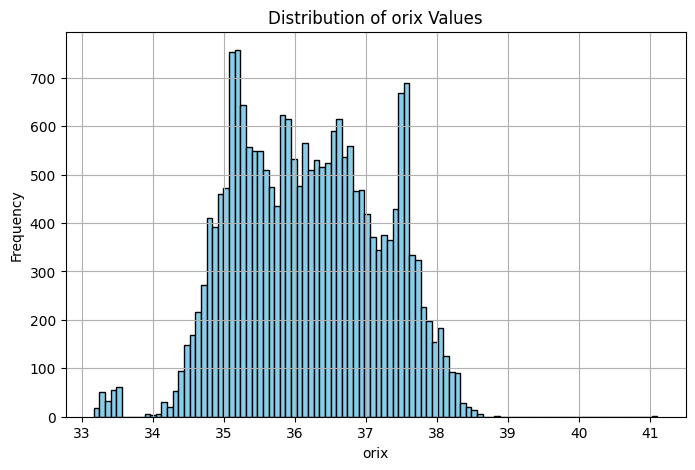

In [11]:
import matplotlib.pyplot as plt

# orix 값 시각화
plt.figure(figsize=(8, 5))
plt.hist(result['위도'], bins=100, color='skyblue', edgecolor='black')
plt.title('Distribution of orix Values')
plt.xlabel('orix')
plt.ylabel('Frequency')
plt.grid(True)
plt.show()

In [9]:
#df저장
result.to_csv('../data/address_with_lon_lat_final.csv', index=False)